In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#importing dataset

data_comments=pd.read_csv("GBcomments.csv", error_bad_lines=False)

b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [3]:
data_comments.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [4]:
from textblob import TextBlob

In [5]:
TextBlob("It's more accurate to call it the M+ (1000) be...").sentiment.polarity  #to check polarity of this statement

0.45000000000000007

In [6]:
data_comments.isna().sum()    # total null values

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [7]:
data_comments.dropna(inplace=True)   # dropping null values

In [8]:
data_comments.shape  

(718424, 4)

In [9]:
polarity=[]

for i in data_comments["comment_text"]:
    polarity.append(TextBlob(i).sentiment.polarity)    # calculate polarity of every comment
    

In [10]:
data_comments["Polarity"]=polarity     # add a new column polarity

In [11]:
data_comments.head(20)

,video_id,comment_text,likes,replies,Polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


## EDA for positive sentences

In [12]:
data_comments_positive=data_comments[data_comments["Polarity"]==1]   # calculating positive polarity

In [13]:
data_comments_positive.shape        # calculating total number of positive polarity

(20400, 5)

In [14]:
data_comments_positive.head()  

,video_id,comment_text,likes,replies,Polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


In [15]:
from wordcloud import WordCloud,STOPWORDS     

In [16]:
stopwords=set(STOPWORDS)         

In [17]:
total_comments=" ".join(data_comments_positive["comment_text"]) 
total_comments

"Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life. The best thing to ever happen to iPhone Apple is always awesome \\n\\nhttps://youtu.be/rftzm6X1yP4 das a lot of edditing you have done there ... I like it :D Welcome to the Scandiworld! Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life. WHY DO I KEEP FREAKING LAUGHING EACH TIME I WATCH IT AGAIN ! even though I know how it will end. omg the best 😂 LIKE = MEET CELEBRITY \\nSUBSCRIBE = BECOME A BILLIONAIRE\\nSCROLL UP/DOWN = DEATH FOR YOU AND EVERYONE YOU LOVE!!!!!!!!!!!!!!!!!!!!!!!!!!!!! the sonic air timer was perfect no 16 on trending impressive My daughters name is lacey <3 I'm 17 and can proudly say Moon Dreamers was one of my favourite shows! if I could subscribe to Dude Perfect a million times I would You guys should make dude perfect sceets To be a dude perfect member it is so awesome .... 

In [18]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments) 

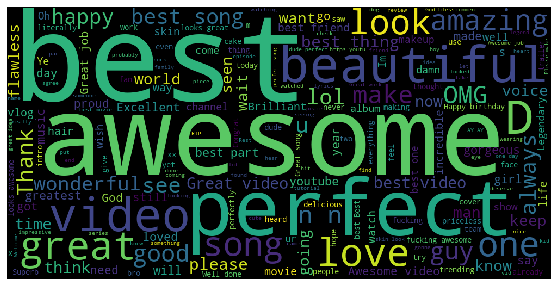

In [19]:
# plotting wordcloud figure

plt.figure(figsize=(15,5))
plt.imshow(wordcloud)

ax=plt.gca()
ax.axis('off')
plt.show()

## EDA for negative sentences

In [20]:
data_comments_negative=data_comments[data_comments["Polarity"]==-1]

In [21]:
total_comment=" ".join(data_comments_negative["comment_text"])

In [22]:
wordclouds=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comment)

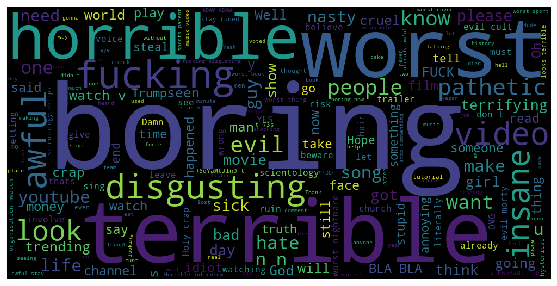

In [23]:
plt.figure(figsize=(15,5))
plt.imshow(wordclouds)

ax=plt.gca()
ax.axis('off')
plt.show()

## Trending tags on you tube

In [24]:
videos=pd.read_csv("USvideos.csv",error_bad_lines=False)

b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


In [25]:
videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09


In [26]:
videos['tags']

0       logan paul vlog|logan paul|logan|paul|olympics...
1       Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...
2                                                  [none]
3       apple iphone x hands on|Apple iPhone X|iPhone ...
4       jacksfilms|parody|parodies|iphone|iphone x|iph...
                              ...                        
7987    sinkhole|how do sinkholes form|sinkhole in wat...
7988    Business Insider|Donald Trump|Hillary Clinton|...
7989    LP|Death Valley|Other People|Lost On You|The M...
7990    YouTube FanFest|#YTFF|Washington DC|USA|YTFF|#...
7991    LIGO|Virgo|collaboration|space|science|nationa...
Name: tags, Length: 7992, dtype: object

In [27]:
tags_complete=' '.join(videos['tags'])

In [28]:
tags_complete

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [29]:
import re

In [30]:
tags=re.sub('[^a-zA-Z]',' ',tags_complete)

In [31]:
tags

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button   M subscribers logan paul   year vlogging   year vlog dwarf mamba play button logan paul history youtube history   M   M plaque youtube button diamond button logang logang   life Apple iPhone    iPhone Ten iPhone Portrait Lighting A   Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone  none  apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event      apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone      apple iphone ios    the verge verge jacksfilms parody parodies iphone iphone x iphone   apple emoji a   a   films a   trailers independent films trailer HD official movie film a   movies oscar 

In [32]:
tags=re.sub(' +',' ',tags)

In [33]:
tags

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button M subscribers logan paul year vlogging year vlog dwarf mamba play button logan paul history youtube history M M plaque youtube button diamond button logang logang life Apple iPhone iPhone Ten iPhone Portrait Lighting A Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone none apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone apple iphone ios the verge verge jacksfilms parody parodies iphone iphone x iphone apple emoji a a films a trailers independent films trailer HD official movie film a movies oscar winner academy award winner The Disaster A

In [34]:
wordcloud=WordCloud(width=1000,height=500,stopwords=set(STOPWORDS)).generate(tags)

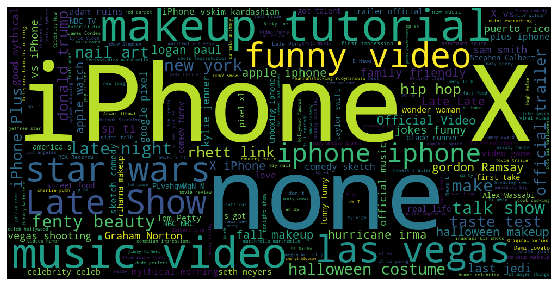

In [35]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)

ax=plt.gca()
ax.axis('off')
plt.show()

## Analysis on likes, views and dislikes and their correlation

Text(0.5, 1.0, 'Regression plot for views and likes')

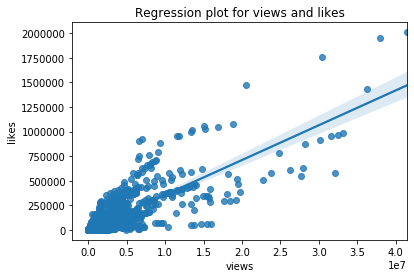

In [36]:
sns.regplot(data=videos,x='views',y='likes')
plt.title("Regression plot for views and likes")

Text(0.5, 1.0, 'Regression plot for views and dislikes')

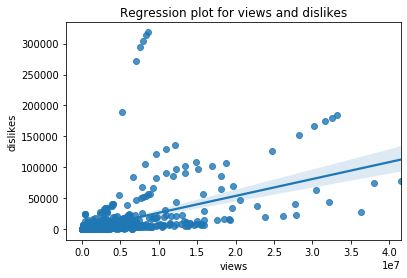

In [37]:
sns.regplot(data=videos,x='views',y='dislikes')
plt.title("Regression plot for views and dislikes")

In [38]:
df_corr=videos[['views','likes','dislikes']]

In [39]:
df_corr.corr()

,views,likes,dislikes
views,1.000000,0.832844,0.541955
likes,0.832844,1.000000,0.497439
dislikes,0.541955,0.497439,1.000000


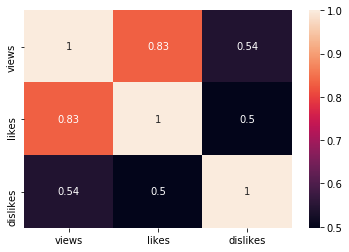

In [40]:
sns.heatmap(df_corr.corr(),annot=True)

## Analyse emojis in comments

In [41]:
data_comments.head()

,video_id,comment_text,likes,replies,Polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00


In [42]:
data_comments['comment_text'][1]

'To be there with a samsung phone\\n😂😂😂'

In [43]:
print('\U0001F600')     # unicode character of an emoji

😀


In [44]:
import emoji

In [45]:
len(data_comments)

718424

In [46]:
comment = data_comments["comment_text"][1]

In [47]:
[c for c in comment if c in emoji.UNICODE_EMOJI['en']]

['😂', '😂', '😂']

In [48]:
s=''
for i in data_comments['comment_text']:
    list=[c for c in i if c in emoji.UNICODE_EMOJI['en']]
    for ele in list:
        s=s+ele

In [49]:
len(s)

333278

In [50]:
s

'😂😂😂😭😭😭😢😢😢❤❤😂👏👇👇👇👇👇👇👇👇👇👇🌞😎😣😥😫😭✌😂👎🏻👎🏻👎🏻👎🏻😂🖕😘😘▶⏭⏮◀🔥🔥😊😊🤔🤔😂😂😂😂👏🏻👏🏻❤❤😜😍😍😅❤😍😍✌😂😂😂😊😂😂😂😂😏😏😭💔😊❤❤❤❤❤😂😂😊❤😂🤣✨🌈😘😂😂❤😊😂😊😂💗😂😊😊😊💖🐢😉😍😂😂💗💗😻😻❤😂😂❤❤🤗👌🏼👌🏼😂😂😂😂💖😩🙊♥♥♥😂😂😂💙💙💙💙💙💙😂😂😂❤❤❤😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😱😊😛🌳🌽🎃🚣🚂😂😂😊😕😋🤣😅😢💔😂😊🤡🙏🙏🙏👊🏿🙇🏽👋😅😅😅😅😂😂🤔😎😎😎😎😎😎😎😍😍😍😍😍😍😘😘😘😘😘😘😘😲🖕💪🤘💓☺☺😂😂😂💕😄😄😍💕😉😩❤❤💕❤😂💕😍💗👫💖😆💕💖💕😍😍😊😄😍😀💗🦄😍😊😂😊👍😍♥❤😂👶🏻🤗☺😘💙💙💙😍😍😊😎🤘🖤👌👌😍😂👌🍍😎😎😄😄😄😄😂😂😂😬💜💜💜😭😂😍😍💖😂😂😂😂😂😂😂😭😂😭😂😭😂😂😂😍😍😍😭😍😍😂👀👀🤔😂😂😂😂😂😂😂😂😂😂🍸🍸🍸🍸🍸😂😂😂🤣🤣🤣😂😂😂😂😍💜💜💜💜😂😂😂😅😂😍💖😂😻😉🔥❤😻❤😭😭😭😭😭😭😭👍🏻😍💚💙❤❤😫❤❤❤❤❤♥😍❤😊😍😎💄🐐😅😂😂😊😊👀👌🏽❤❤❤😂💖🎉💪💪🏽😎🙌🙌😜❤❤💛💛😎🙏💚🎉🎉❤🎉🎉🎉🎉🎊🎉🎊🎉😭💗😍😍😍😍😍😍😍👏✌😁❤❤😂💋💋👫💘😻💋💋😂👑🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥😂😐😑😩👌🏻🔥💖👏🏻👀✨👅💦💕❤😍🔥🔥🔥❤❤❤❤❤❤❤👌😍😍😍😞🌴💜💜💜💜😍😍😍😍😍❤❤❤❤❤😊❤❤❤❤🍔🍟😒🌿😄😄😄😉🍲🍱🎏❤💪👊🏽😘😂😂😂❤🙋☺😍😍😚💕😉😂❤❤😊☺💓🌸🙄🙄🙄🙁😞😊🙄😍😨😍😍😍😍😎😃😂😍😏😌😂😎🤑😂😉👍🏻🔥💯🚨😊☺😂😂😂🤣🙂❤❤😀😀😀♥♥😂❤😂😓😭😂❤❤😖😖😂😂😂💗💝😘💐💐💐😂😍☺😂❤😭💕🙌🏽🙌🏽🙌🏽😘😘❤❤💖😫😖📱😂😏🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😁🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😎😂😂👍🏼💯💕♥♥♥😱😱😱❤❤❤😍😍😩😩😩😩😩😩😩😍😻😻😻😻😻😳🥀♥♥♥♥♥♥😍😍😍🙃😂💕💕💕😍💕💕❤❤💕😍🍫🌹💖❤😍👸🏿👸🏿👸🏿👸🏿👸🏿💗😊😊😩❤👌🏼😻😊😍❤😂😂👏🏼❤❤❤❤❤😍😍😍💚💚💚💚💚😍😭🌹😍❤😍😍😍💚💚💚💚💚😍💚💚💚☺💙😀😍💚😕😍👌😂😂😂😍👌🏻💗❤💚💚💚😸😙😙😘💚💚💚💚😍😭😭💖💓💓💓😍❤😘😘🤗🤗🤗❤😀😀💓💓💓❤😂❤😍❤❤♥♥♥❤🙌❤😂❤❤😍❤💜😍😭😍😍😍😊💗💕😍❤💗💗💛💛💛💖💖😍😐😍😍😍😍🗿😂🤗😩😩😩💖💖💖❤❤❤❤❤😍😍✨😍👍🏻😁😂😍💅❤😘❤❤😈👀😄😈👍☝👆✊👌✌👊✋👋👏👐👉👈💔😂😂😬😭😥☺😂😂😂😂😍😍😍😜😂😂😂😂😂😒👎🏽😱😱😱😱😂😎😛🙊✊✌😑😑😑👌😊😊😍😊❤❤❤❤😍

In [51]:
# create a dictionary of having each emoji with its frequency as well

result={}
for i in set(s):
    result[i]=s.count(i) 

In [52]:
result

{'🕘': 7,
 '↖': 5,
 '⛸': 5,
 '💊': 25,
 '🤣': 2374,
 '☹': 194,
 '🛠': 6,
 '🍝': 22,
 '🏁': 38,
 '🐇': 41,
 '🐲': 33,
 '👮': 31,
 '🏡': 41,
 '🍢': 14,
 '♿': 12,
 '💟': 339,
 '🍀': 68,
 '🐛': 30,
 '🍦': 48,
 '🔳': 5,
 '⚗': 4,
 '🔬': 18,
 '⛲': 11,
 '⛄': 7,
 '🐴': 28,
 '♦': 5,
 '✏': 21,
 '🍖': 43,
 '🏕': 7,
 '🕵': 22,
 '📸': 35,
 '🏄': 15,
 '🦆': 4,
 '🐶': 467,
 '☸': 4,
 '🍯': 105,
 '🌜': 35,
 '📈': 12,
 '📡': 9,
 '😛': 340,
 '👆': 114,
 '🏍': 8,
 '😰': 261,
 '🔞': 20,
 '♣': 23,
 '🔸': 88,
 '🏋': 11,
 '🐁': 31,
 '🎦': 21,
 '😄': 1541,
 '❌': 62,
 '🌱': 35,
 '➡': 44,
 '🐖': 32,
 '🦇': 6,
 '🎗': 29,
 '🐋': 19,
 '🔃': 5,
 '🤦': 439,
 '♐': 12,
 '🤒': 43,
 '🔺': 20,
 '🍅': 30,
 '⛩': 5,
 '🚯': 6,
 '🤯': 3,
 '🦐': 4,
 '💛': 2169,
 '⏺': 5,
 '💂': 18,
 '🥈': 4,
 '🔵': 803,
 '🍋': 53,
 '🧙': 6,
 '⛅': 18,
 '📕': 10,
 '🈳': 5,
 '👖': 29,
 '🆑': 8,
 '🤧': 107,
 '🚒': 29,
 '⚒': 5,
 '🌦': 19,
 '🔙': 9,
 '🎚': 7,
 '🎛': 7,
 '🔡': 5,
 '🍱': 27,
 '😞': 415,
 '🛒': 1,
 '🤕': 35,
 '🕉': 10,
 '🈸': 16,
 '🙀': 79,
 '😶': 225,
 '🏂': 13,
 '📘': 12,
 '📋': 9,
 '🐊': 61,
 '🔣': 5,
 '👍': 5817,
 '

In [53]:
result.items()     # sort the emojis according to its count or frequency

dict_items([('🕘', 7), ('↖', 5), ('⛸', 5), ('💊', 25), ('🤣', 2374), ('☹', 194), ('🛠', 6), ('🍝', 22), ('🏁', 38), ('🐇', 41), ('🐲', 33), ('👮', 31), ('🏡', 41), ('🍢', 14), ('♿', 12), ('💟', 339), ('🍀', 68), ('🐛', 30), ('🍦', 48), ('🔳', 5), ('⚗', 4), ('🔬', 18), ('⛲', 11), ('⛄', 7), ('🐴', 28), ('♦', 5), ('✏', 21), ('🍖', 43), ('🏕', 7), ('🕵', 22), ('📸', 35), ('🏄', 15), ('🦆', 4), ('🐶', 467), ('☸', 4), ('🍯', 105), ('🌜', 35), ('📈', 12), ('📡', 9), ('😛', 340), ('👆', 114), ('🏍', 8), ('😰', 261), ('🔞', 20), ('♣', 23), ('🔸', 88), ('🏋', 11), ('🐁', 31), ('🎦', 21), ('😄', 1541), ('❌', 62), ('🌱', 35), ('➡', 44), ('🐖', 32), ('🦇', 6), ('🎗', 29), ('🐋', 19), ('🔃', 5), ('🤦', 439), ('♐', 12), ('🤒', 43), ('🔺', 20), ('🍅', 30), ('⛩', 5), ('🚯', 6), ('🤯', 3), ('🦐', 4), ('💛', 2169), ('⏺', 5), ('💂', 18), ('🥈', 4), ('🔵', 803), ('🍋', 53), ('🧙', 6), ('⛅', 18), ('📕', 10), ('🈳', 5), ('👖', 29), ('🆑', 8), ('🤧', 107), ('🚒', 29), ('⚒', 5), ('🌦', 19), ('🔙', 9), ('🎚', 7), ('🎛', 7), ('🔡', 5), ('🍱', 27), ('😞', 415), ('🛒', 1), ('🤕', 35), 

In [54]:
final={}
for key,value in sorted(result.items(),key =lambda item:item[1]):
    final[key]=value
final

{'🛒': 1,
 '🥡': 1,
 '🧤': 1,
 '🤟': 1,
 '🥜': 1,
 '🦓': 1,
 '🥚': 1,
 '🛷': 1,
 '🧠': 1,
 '🦏': 1,
 '🤹': 1,
 '🤺': 1,
 '🥟': 1,
 '🥨': 1,
 '🤾': 1,
 '🧣': 1,
 '🥌': 1,
 '🤽': 1,
 '🧛': 2,
 '🧘': 2,
 '🦖': 2,
 '🤱': 2,
 '🧝': 2,
 '🦔': 2,
 '🧢': 2,
 '🦕': 2,
 '🥅': 2,
 '🧡': 2,
 '🧒': 2,
 '🎌': 2,
 '🤯': 3,
 '🥖': 3,
 '🤨': 3,
 '🤫': 3,
 '🧐': 3,
 '🥄': 3,
 '⚗': 4,
 '🦆': 4,
 '☸': 4,
 '🦐': 4,
 '🥈': 4,
 '🛢': 4,
 '🖍': 4,
 '⏯': 4,
 '🛣': 4,
 '🗄': 4,
 '♟': 4,
 '♾': 4,
 '🤵': 4,
 '🧟': 4,
 '🤬': 4,
 '⚙': 4,
 '🦍': 4,
 '🖇': 4,
 '☦': 4,
 '🛬': 4,
 '🏌': 4,
 '🥝': 4,
 '🗓': 4,
 '🏷': 4,
 '⏏': 4,
 '⏹': 4,
 '⏲': 4,
 '🥞': 4,
 '🗂': 4,
 '💹': 4,
 '⚧': 4,
 '⏸': 4,
 '↖': 5,
 '⛸': 5,
 '🔳': 5,
 '♦': 5,
 '🔃': 5,
 '⛩': 5,
 '⏺': 5,
 '🈳': 5,
 '⚒': 5,
 '🔡': 5,
 '🔣': 5,
 '🔠': 5,
 '⛱': 5,
 '❎': 5,
 '🛥': 5,
 '🖊': 5,
 '🔢': 5,
 '🔁': 5,
 '🚎': 5,
 '🔄': 5,
 '🖲': 5,
 '➿': 5,
 '🗜': 5,
 '🔲': 5,
 '🕎': 5,
 '⛴': 5,
 '🗞': 5,
 '🚛': 5,
 '🚻': 5,
 '🔖': 5,
 '🚉': 5,
 '🔚': 5,
 '◽': 5,
 '⌨': 5,
 '🛂': 5,
 '🔤': 5,
 '🤮': 5,
 '🥉': 5,
 '㊙': 5,
 '🗳': 5,
 '🌫': 5,
 '🚟': 5,
 '🛋': 5,
 

In [55]:
## convert dictionary into list for this we have to unzip this dictionary
keys=[*final.keys()]
keys

['🛒',
 '🥡',
 '🧤',
 '🤟',
 '🥜',
 '🦓',
 '🥚',
 '🛷',
 '🧠',
 '🦏',
 '🤹',
 '🤺',
 '🥟',
 '🥨',
 '🤾',
 '🧣',
 '🥌',
 '🤽',
 '🧛',
 '🧘',
 '🦖',
 '🤱',
 '🧝',
 '🦔',
 '🧢',
 '🦕',
 '🥅',
 '🧡',
 '🧒',
 '🎌',
 '🤯',
 '🥖',
 '🤨',
 '🤫',
 '🧐',
 '🥄',
 '⚗',
 '🦆',
 '☸',
 '🦐',
 '🥈',
 '🛢',
 '🖍',
 '⏯',
 '🛣',
 '🗄',
 '♟',
 '♾',
 '🤵',
 '🧟',
 '🤬',
 '⚙',
 '🦍',
 '🖇',
 '☦',
 '🛬',
 '🏌',
 '🥝',
 '🗓',
 '🏷',
 '⏏',
 '⏹',
 '⏲',
 '🥞',
 '🗂',
 '💹',
 '⚧',
 '⏸',
 '↖',
 '⛸',
 '🔳',
 '♦',
 '🔃',
 '⛩',
 '⏺',
 '🈳',
 '⚒',
 '🔡',
 '🔣',
 '🔠',
 '⛱',
 '❎',
 '🛥',
 '🖊',
 '🔢',
 '🔁',
 '🚎',
 '🔄',
 '🖲',
 '➿',
 '🗜',
 '🔲',
 '🕎',
 '⛴',
 '🗞',
 '🚛',
 '🚻',
 '🔖',
 '🚉',
 '🔚',
 '◽',
 '⌨',
 '🛂',
 '🔤',
 '🤮',
 '🥉',
 '㊙',
 '🗳',
 '🌫',
 '🚟',
 '🛋',
 '🛤',
 '🦒',
 '↪',
 '🔼',
 '🏮',
 '🗒',
 '🔂',
 '🥛',
 '🈲',
 '🎐',
 '♠',
 '🕹',
 '🗃',
 '🚠',
 '↔',
 '☂',
 '🈹',
 '◻',
 '🧖',
 '🈯',
 '🖼',
 '🈁',
 '🖨',
 '🈵',
 '🧜',
 '🆎',
 '⚾',
 '↕',
 '↩',
 '⛏',
 '🈂',
 'Ⓜ',
 '✡',
 '🆔',
 'ℹ',
 '🆖',
 '🈴',
 '🚁',
 '🛠',
 '🦇',
 '🚯',
 '🧙',
 '🚈',
 '🛅',
 '🚃',
 '🛑',
 '🏚',
 '🥋',
 '⏫',
 '🎟',
 '⛹',
 '🦌',
 '🌥',
 '🏓',
 '🏩',
 '🧞'

In [56]:
values=[*final.values()]
values

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,


In [57]:
df=pd.DataFrame({'chars':keys[-20:],'num':values[-20:]})    #last 20 keys and values
df

,chars,num
0,🙌,2734
1,🏼,2961
2,💙,2968
3,💗,3071
4,👌,3534
5,💜,3616
6,🏻,4412
7,💖,4809
8,😊,4946
9,👏,5357


In [58]:
import plotly.graph_objs as go
from plotly.offline import iplot

In [59]:
trace=go.Bar(
x=df['chars'],
y=df['num']
)

iplot([trace])